In [70]:
import numpy as np
import pandas as pd
import json
import cv2
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from keras_unet.metrics import iou, iou_thresholded
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler

In [71]:
train_path = 'images/train'
test_path = 'images/test'
val_path = 'images/val'
annotations_train = 'annotations/train_whole'
annotations_test = 'annotations/test_whole'
annotations_val = 'annotations/val_whole'

In [72]:
with open("{}/train.json".format(annotations_train), 'r') as f:
    annottrain = json.loads(f.read())

with open("{}/val.json".format(annotations_val), 'r') as f:
    annotval = json.loads(f.read())

with open("{}/test.json".format(annotations_test), 'r') as f:
    annottest = json.loads(f.read())

In [73]:
for row in annottrain:
    print(row)

info
license
images
annotations
categories


In [74]:
# Load the images, annotations and categories as pandas df
train_images_df = pd.DataFrame(annottrain['images'])
train_annotations_df = pd.DataFrame(annottrain['annotations'])
train_categories_df = pd.DataFrame(annottrain['categories'])

In [75]:
val_images_df = pd.DataFrame(annotval['images'])
val_annotations_df = pd.DataFrame(annotval['annotations'])
val_categories_df = pd.DataFrame(annotval['categories'])

In [76]:
test_images_df = pd.DataFrame(annottest['images'])
test_annotations_df = pd.DataFrame(annottest['annotations'])
test_categories_df = pd.DataFrame(annottest['categories'])

In [77]:
# Merge images, annotations and categories
train_df = pd.merge(train_images_df, train_annotations_df, left_on='id', right_on='image_id')
train_df = pd.merge(train_df, train_categories_df, left_on='category_id', right_on='id')

In [78]:
val_df = pd.merge(val_images_df, val_annotations_df, left_on='id', right_on='image_id')
val_df = pd.merge(val_df, val_categories_df, left_on='category_id', right_on='id')

In [79]:
test_df = pd.merge(test_images_df, test_annotations_df, left_on='id', right_on='image_id')
test_df = pd.merge(test_df, test_categories_df, left_on='category_id', right_on='id')

In [80]:
train_df.head()

,height,width,id_x,file_name,id_y,image_id,category_id,bbox,segmentation,iscrowd,area,id,name,supercategory
0,375,500,0,n04252225_8354.JPEG,0,0,25,"[29, 142, 458, 182]","[[259.0, 142.0, 258.0, 143.0, 235.0, 143.0, 23...",0,49147.0,25,n04252225,Car
1,357,500,1,n04146614_18045.JPEG,1,1,137,"[115, 25, 318, 313]","[[416.0, 127.0, 415.0, 128.0, 415.0, 135.0, 41...",0,78163.0,137,n04146614,Car
2,375,500,2,n04465501_3338.JPEG,2,2,115,"[66, 17, 433, 357]","[[191.0, 289.0, 189.0, 291.0, 188.0, 291.0, 18...",0,47998.0,115,n04465501,Car
3,349,600,3,n03100240_12854.JPEG,3,3,55,"[41, 47, 530, 273]","[[261.0, 47.0, 260.0, 48.0, 247.0, 48.0, 246.0...",0,97832.0,55,n03100240,Car
4,500,375,4,n02701002_12308.JPEG,4,4,21,"[18, 49, 342, 362]","[[308.0, 49.0, 307.0, 50.0, 291.0, 50.0, 290.0...",0,93356.0,21,n02701002,Car


In [81]:
train_df.shape

(20457, 14)

In [82]:
bottle_train_df = train_df[(train_df['supercategory'] == 'Bottle') & (train_df['category_id'] != 153)]
bottle_val_df = val_df[(val_df['supercategory'] == 'Bottle') & (val_df['category_id'] != 153)]
bottle_test_df = test_df[(test_df['supercategory'] == 'Bottle') & (test_df['category_id'] != 153)]

In [83]:
bottle_train_df.head()

,height,width,id_x,file_name,id_y,image_id,category_id,bbox,segmentation,iscrowd,area,id,name,supercategory
6421,375,500,6425,n04557648_11019.JPEG,6425,6425,70,"[220, 24, 87, 288]","[[249.0, 24.0, 248.0, 25.0, 247.0, 25.0, 246.0...",0,21172.0,70,n04557648,Bottle
6422,500,375,6426,n03983396_12563.JPEG,6426,6426,58,"[59, 43, 313, 422]","[[166.0, 43.0, 165.0, 44.0, 162.0, 44.0, 161.0...",0,53793.0,58,n03983396,Bottle
6423,375,500,6427,n04557648_1792.JPEG,6427,6427,70,"[220, 23, 113, 331]","[[281.0, 23.0, 280.0, 24.0, 264.0, 24.0, 263.0...",0,30986.0,70,n04557648,Bottle
6424,379,500,6428,n04557648_2571.JPEG,6428,6428,70,"[1, 142, 400, 211]","[[1.0, 142.0, 1.0, 254.0, 2.0, 255.0, 4.0, 255...",0,48251.0,70,n04557648,Bottle
6425,500,375,6429,n04557648_3968.JPEG,6429,6429,70,"[151, 162, 86, 196]","[[173.0, 162.0, 172.0, 163.0, 171.0, 163.0, 17...",0,11085.0,70,n04557648,Bottle


In [84]:
bottle_train_df.shape

(308, 14)

In [85]:
bottle_val_df.shape

(18, 14)

In [86]:
bottle_test_df.shape

(38, 14)

In [87]:
bottle_train_df

,height,width,id_x,file_name,id_y,image_id,category_id,bbox,segmentation,iscrowd,area,id,name,supercategory
6421,375,500,6425,n04557648_11019.JPEG,6425,6425,70,"[220, 24, 87, 288]","[[249.0, 24.0, 248.0, 25.0, 247.0, 25.0, 246.0...",0,21172.0,70,n04557648,Bottle
6422,500,375,6426,n03983396_12563.JPEG,6426,6426,58,"[59, 43, 313, 422]","[[166.0, 43.0, 165.0, 44.0, 162.0, 44.0, 161.0...",0,53793.0,58,n03983396,Bottle
6423,375,500,6427,n04557648_1792.JPEG,6427,6427,70,"[220, 23, 113, 331]","[[281.0, 23.0, 280.0, 24.0, 264.0, 24.0, 263.0...",0,30986.0,70,n04557648,Bottle
6424,379,500,6428,n04557648_2571.JPEG,6428,6428,70,"[1, 142, 400, 211]","[[1.0, 142.0, 1.0, 254.0, 2.0, 255.0, 4.0, 255...",0,48251.0,70,n04557648,Bottle
6425,500,375,6429,n04557648_3968.JPEG,6429,6429,70,"[151, 162, 86, 196]","[[173.0, 162.0, 172.0, 163.0, 171.0, 163.0, 17...",0,11085.0,70,n04557648,Bottle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6824,375,500,6828,n04591713_913.JPEG,6828,6828,87,"[63, 1, 167, 373]","[[122.0, 1.0, 121.0, 2.0, 111.0, 2.0, 111.0, 1...",0,53912.0,87,n04591713,Bottle
6825,500,375,6829,n04557648_8887.JPEG,6829,6829,70,"[143, 163, 232, 83]","[[160.0, 213.0, 159.0, 214.0, 151.0, 214.0, 15...",0,8105.0,70,n04557648,Bottle
6826,500,333,6830,n04591713_3393.JPEG,6830,6830,87,"[90, 1, 215, 497]","[[144.0, 1.0, 141.0, 4.0, 140.0, 4.0, 137.0, 7...",0,98882.0,87,n04591713,Bottle
6827,500,334,6831,n03983396_2102.JPEG,6831,6831,58,"[19, 2, 300, 497]","[[159.0, 2.0, 158.0, 3.0, 71.0, 3.0, 71.0, 5.0...",0,136605.0,58,n03983396,Bottle


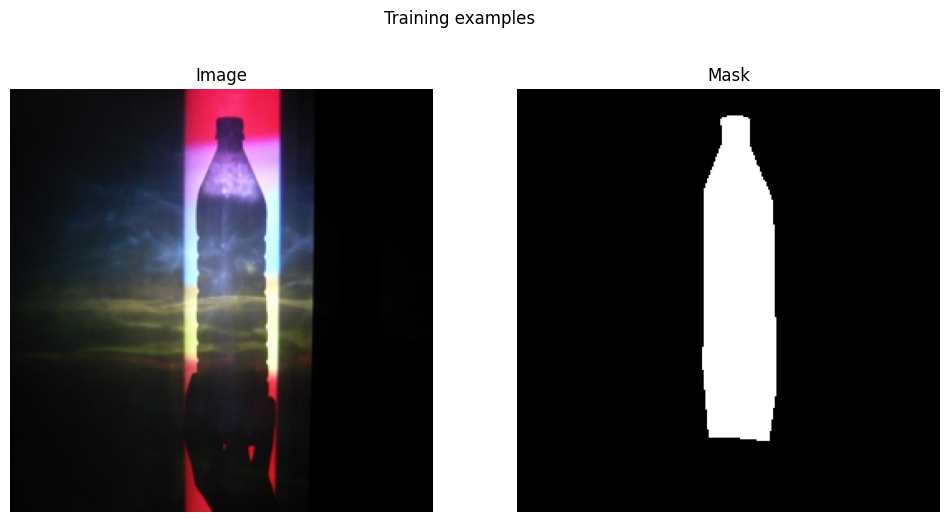

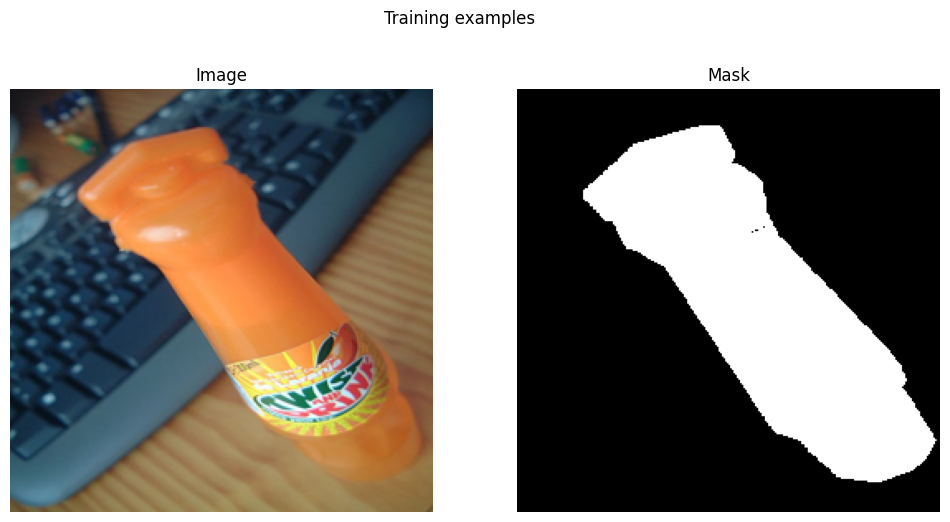

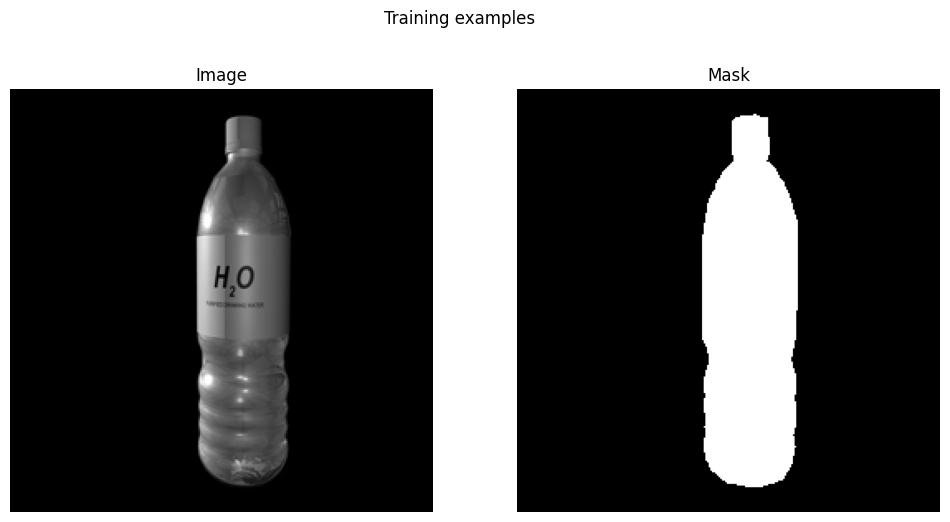

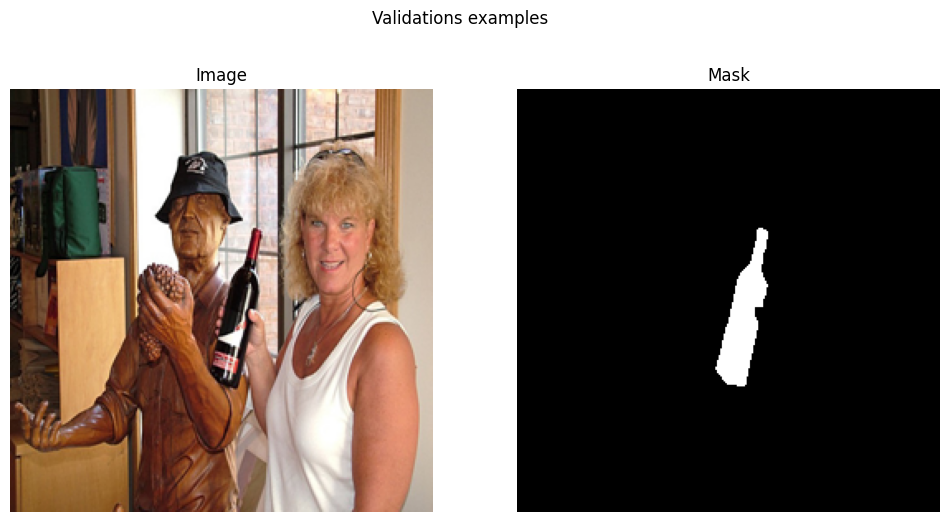

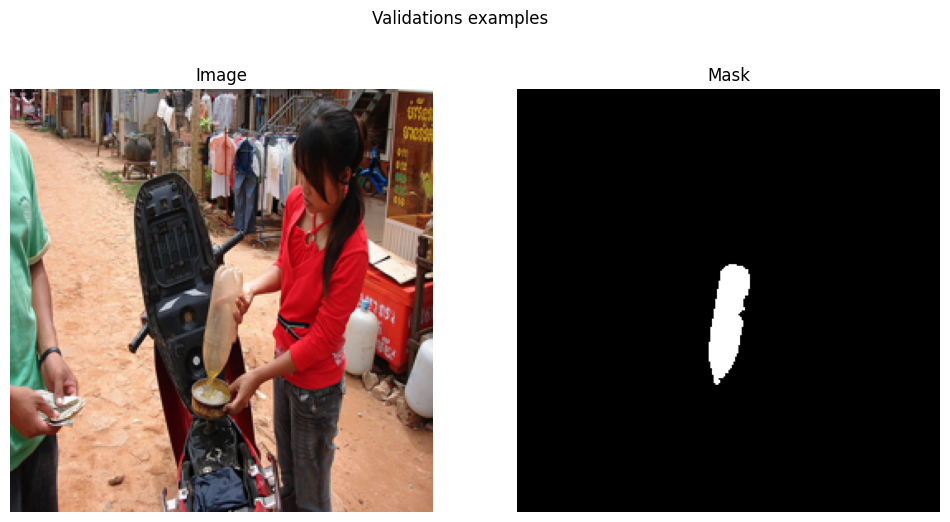

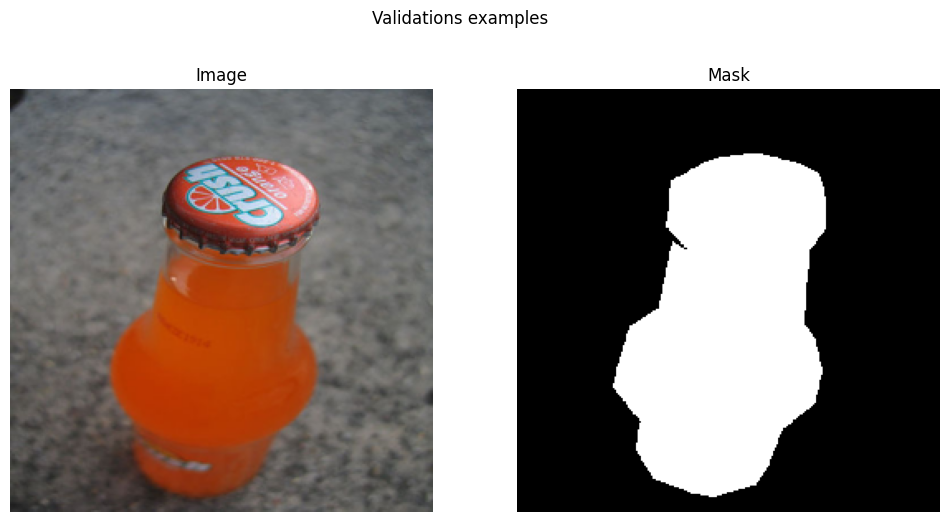

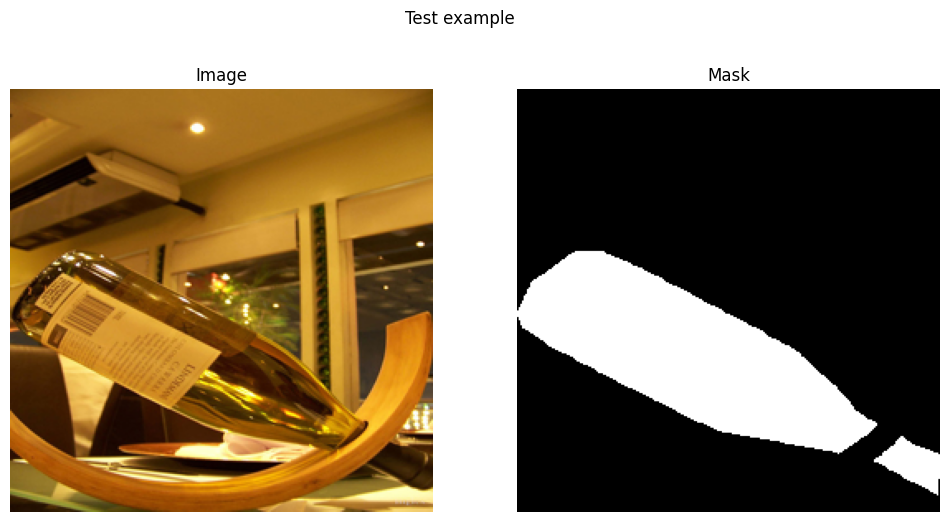

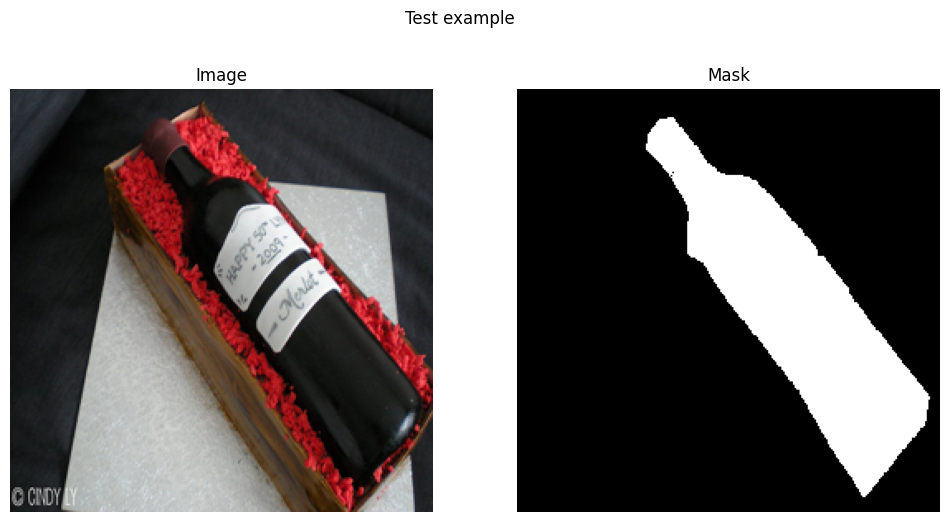

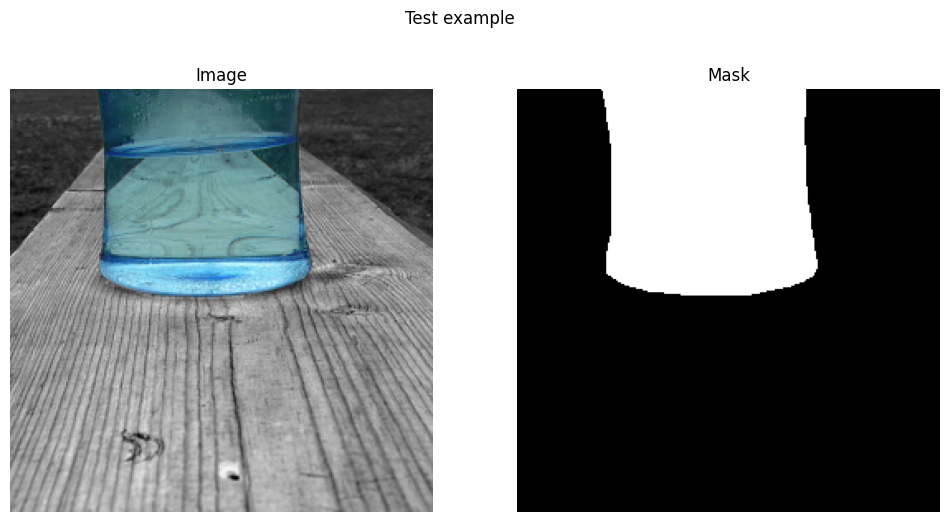

In [88]:
IMAGE_SIZE = (256, 256)

def load_resize_image_plus_mask(file_name, image_id, annotations, image_dir):
    image_path = os.path.join(image_dir, file_name)
    image = load_img(image_path)
    original_size = image.size
    image = image.resize(IMAGE_SIZE)
    image = img_to_array(image)
    
    # initial empty mask
    mask = np.zeros(IMAGE_SIZE, dtype=np.uint8)
    # grab the masks for each image
    image_annotations = [ann for ann in annotations if ann['image_id'] == image_id]
    # calculate scale factor
    scale_x = IMAGE_SIZE[1] / original_size[0]
    scale_y = IMAGE_SIZE[0] / original_size[1]
    # Draw the mask
    for ann in image_annotations:
        for seg in ann['segmentation']:
            points = np.array(seg).reshape(-1, 2)
            points[:, 0] *= scale_x
            points[:, 1] *= scale_y
            cv2.fillPoly(mask, [points.astype(np.int32)], 1)
    
    return image, mask

train_images = []
train_masks = []
# Load the images and their masks into our empty lists
for idx, row in bottle_train_df.iterrows():
    image, mask = load_resize_image_plus_mask(row['file_name'], row['image_id'], annottrain['annotations'], train_path)
    train_images.append(image)
    train_masks.append(mask)

# Convert to array
train_images = np.array(train_images)
train_masks = np.array(train_masks)
# make masks binary for background and our target class
train_masks = (train_masks > 0).astype(np.uint8)

# Do the same for validations images and masks
val_images = []
val_masks = []

for idx, row in bottle_val_df.iterrows():
    image, mask = load_resize_image_plus_mask(row['file_name'], row['image_id'], annotval['annotations'], val_path)
    val_images.append(image)
    val_masks.append(mask)

val_images = np.array(val_images)
val_masks = np.array(val_masks)
val_masks = (val_masks > 0).astype(np.uint8)

# Also for test images and masks
test_images = []
test_masks = []

for idx, row in bottle_test_df.iterrows():
    image, mask = load_resize_image_plus_mask(row['file_name'], row['image_id'], annottest['annotations'], test_path)
    test_images.append(image)
    test_masks.append(mask)

test_images = np.array(test_images)
test_masks = np.array(test_masks)
test_masks = (test_masks > 0).astype(np.uint8)

# Visualize some samples from each set
def plot_image_and_mask(image, mask, title=None):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(image.astype(np.uint8))
    ax[0].set_title("Image")
    ax[0].axis('off')
    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title("Mask")
    ax[1].axis('off')
    plt.suptitle(title)
    plt.show()

for i in range(3):
    plot_image_and_mask(train_images[i], train_masks[i], title="Training examples")
for i in range(3):
    plot_image_and_mask(val_images[i], val_masks[i], title="Validations examples")
for i in range(3):
    plot_image_and_mask(test_images[i], test_masks[i], title="Test example")

In [89]:
np.unique(train_masks)

array([0, 1], dtype=uint8)

In [90]:
train_masks.shape

(308, 256, 256)

In [91]:
train_images.shape

(308, 256, 256, 3)

In [92]:
np.unique(train_images)

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15

In [93]:
# We need to normalize before passing our sets to training
train_images = train_images / 255.0
val_images = val_images / 255.0
test_images = test_images / 255.0

In [94]:
np.unique(train_images)

array([0.        , 0.00392157, 0.00784314, 0.01176471, 0.01568628,
       0.01960784, 0.02352941, 0.02745098, 0.03137255, 0.03529412,
       0.03921569, 0.04313726, 0.04705882, 0.05098039, 0.05490196,
       0.05882353, 0.0627451 , 0.06666667, 0.07058824, 0.07450981,
       0.07843138, 0.08235294, 0.08627451, 0.09019608, 0.09411765,
       0.09803922, 0.10196079, 0.10588235, 0.10980392, 0.11372549,
       0.11764706, 0.12156863, 0.1254902 , 0.12941177, 0.13333334,
       0.13725491, 0.14117648, 0.14509805, 0.14901961, 0.15294118,
       0.15686275, 0.16078432, 0.16470589, 0.16862746, 0.17254902,
       0.1764706 , 0.18039216, 0.18431373, 0.1882353 , 0.19215687,
       0.19607843, 0.2       , 0.20392157, 0.20784314, 0.21176471,
       0.21568628, 0.21960784, 0.22352941, 0.22745098, 0.23137255,
       0.23529412, 0.23921569, 0.24313726, 0.24705882, 0.2509804 ,
       0.25490198, 0.25882354, 0.2627451 , 0.26666668, 0.27058825,
       0.27450982, 0.2784314 , 0.28235295, 0.28627452, 0.29019

In [95]:
train_masks.shape

(308, 256, 256)

In [96]:
np.unique(train_masks)

array([0, 1], dtype=uint8)

In [97]:
# Expand dimension for the masks
train_masks = train_masks.reshape(train_masks.shape[0], train_masks.shape[1], train_masks.shape[2], 1)
val_masks = val_masks.reshape(val_masks.shape[0], val_masks.shape[1], val_masks.shape[2], 1)
test_masks = test_masks.reshape(test_masks.shape[0], test_masks.shape[1], test_masks.shape[2], 1)

In [98]:
train_masks.shape

(308, 256, 256, 1)

In [99]:
def dice_coefficient(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.keras.backend.flatten(tf.cast(y_true, tf.float32))
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice_loss = 1 - dice_coefficient(y_true, y_pred)
    return bce + dice_loss

# U-Net model
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    
    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    drop1 = Dropout(0.1)(pool1)
    
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(drop1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    drop2 = Dropout(0.1)(pool2)
    
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(drop2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    drop3 = Dropout(0.1)(pool3)
    
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(drop3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    drop4 = Dropout(0.1)(pool4)
    
    # Bottleneck
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(drop4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    drop5 = Dropout(0.1)(conv5)
    
    # Decoder
    up6 = concatenate([UpSampling2D(size=(2, 2))(drop5), conv4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    
    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)
    
    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = BatchNormalization()(conv8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)
    conv8 = BatchNormalization()(conv8)
    
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = BatchNormalization()(conv9)
    
    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    
    model.compile(optimizer=Adam(learning_rate=0.0005), loss=combined_loss, metrics=[iou, iou_thresholded])
    
    return model

In [100]:
# initialize our model
input_size = (train_images.shape[1], train_images.shape[2], train_images.shape[3])
model = unet_model(input_size=input_size)

In [49]:
history = model.fit(train_images, 
                    train_masks, 
                    batch_size=8, 
                    validation_data=(val_images, val_masks), 
                    epochs=50,
                    )

Epoch 1/50
39/39 [==============================] - 70s 1s/step - loss: 1.2684 - iou: 0.2824 - iou_thresholded: 0.3287 - val_loss: 22.5415 - val_iou: 0.3141 - val_iou_thresholded: 0.3126
Epoch 2/50
39/39 [==============================] - 23s 601ms/step - loss: 1.1366 - iou: 0.3131 - iou_thresholded: 0.3940 - val_loss: 1.8180 - val_iou: 0.0371 - val_iou_thresholded: 1.0966e-05
Epoch 3/50
39/39 [==============================] - 24s 608ms/step - loss: 1.0994 - iou: 0.3189 - iou_thresholded: 0.3991 - val_loss: 1.7686 - val_iou: 0.0422 - val_iou_thresholded: 1.0966e-05
Epoch 4/50
39/39 [==============================] - 23s 593ms/step - loss: 1.0423 - iou: 0.3309 - iou_thresholded: 0.4114 - val_loss: 1.3336 - val_iou: 0.3518 - val_iou_thresholded: 0.4277
Epoch 5/50
39/39 [==============================] - 23s 585ms/step - loss: 0.9763 - iou: 0.3573 - iou_thresholded: 0.4414 - val_loss: 1.5313 - val_iou: 0.0901 - val_iou_thresholded: 9.4849e-04
Epoch 6/50
39/39 [===========================

In [50]:
model.save('unet_bottle_segmentation.h5')

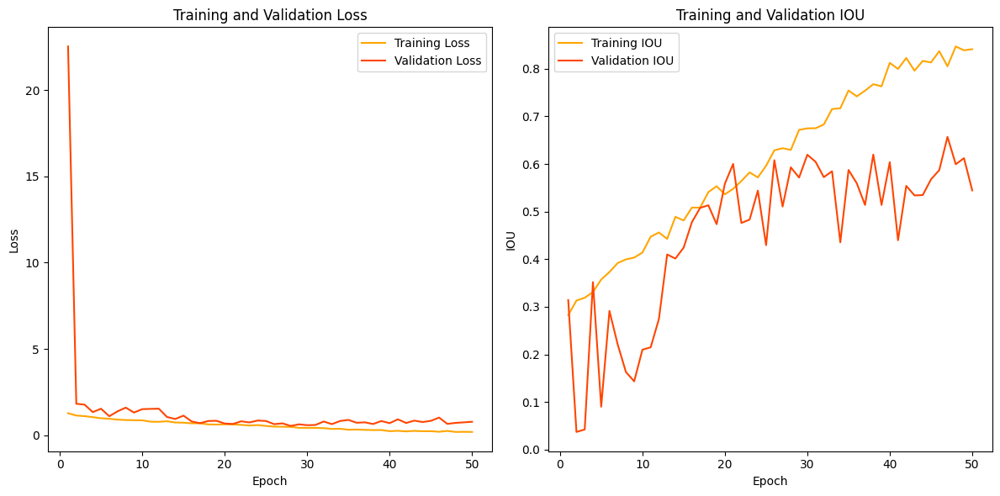

In [101]:
# extract training history
loss = history.history['loss']
val_loss = history.history['val_loss']
iou = history.history['iou']
val_iou = history.history['val_iou']
epochs = range(1, len(loss) + 1)

# Showcase model performance in training
train_color = '#FFA500'  # Orange
val_color = '#FF4500'    # Red

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, color=train_color, linestyle='-', label='Training Loss')
plt.plot(epochs, val_loss, color=val_color, linestyle='-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, iou, color=train_color, linestyle='-', label='Training IOU')
plt.plot(epochs, val_iou, color=val_color, linestyle='-', label='Validation IOU')
plt.title('Training and Validation IOU')
plt.xlabel('Epoch')
plt.ylabel('IOU')
plt.legend()
plt.tight_layout()
plt.show()


In [58]:
# evaluate using our test set
# Limited to batch_size 1, ran out of memory :)
test_loss, test_iou, test_iou_thresholded = model.evaluate(test_images, test_masks,batch_size=1)
print("Test Loss:", test_loss)
print("Test Mean IoU:", test_iou)
print("Test IoU Thresholded:", test_iou_thresholded)

38/38 [==============================] - 1s 27ms/step - loss: 1.0135 - iou: 0.4740 - iou_thresholded: 0.4864
Test Loss: 1.013461709022522
Test Mean IoU: 0.47401371598243713
Test IoU Thresholded: 0.48636460304260254


In [59]:
# predict the masks on our test set
predicted_masks = model.predict(test_images,batch_size=1)

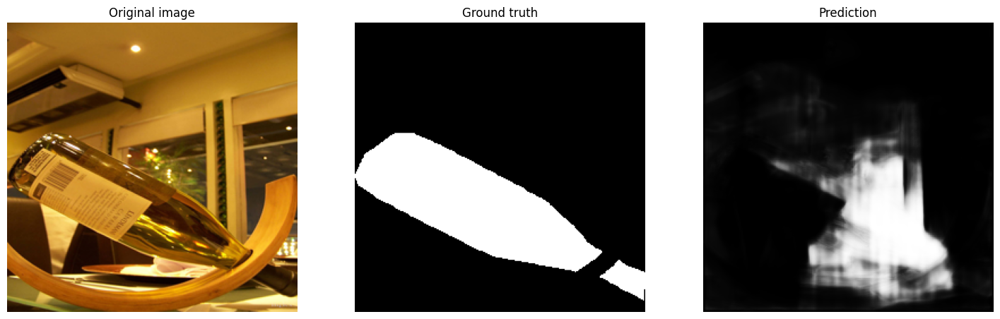

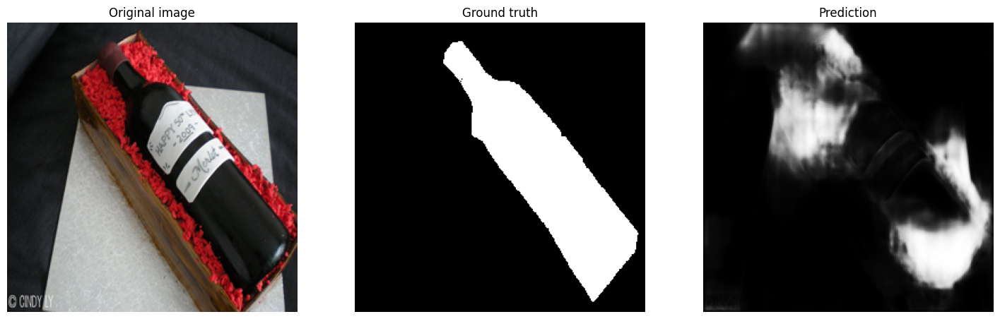

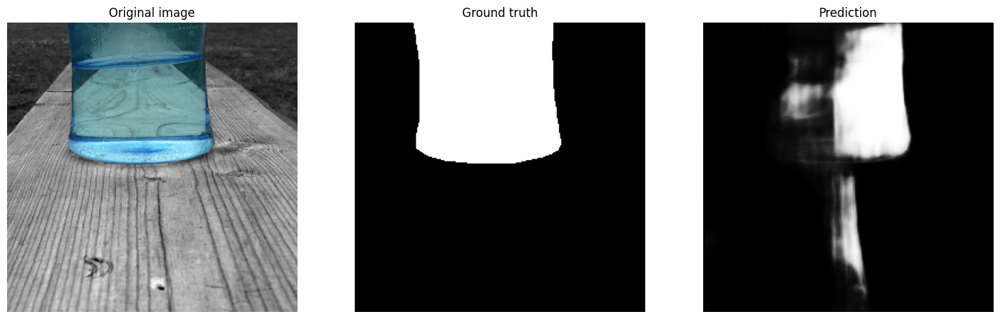

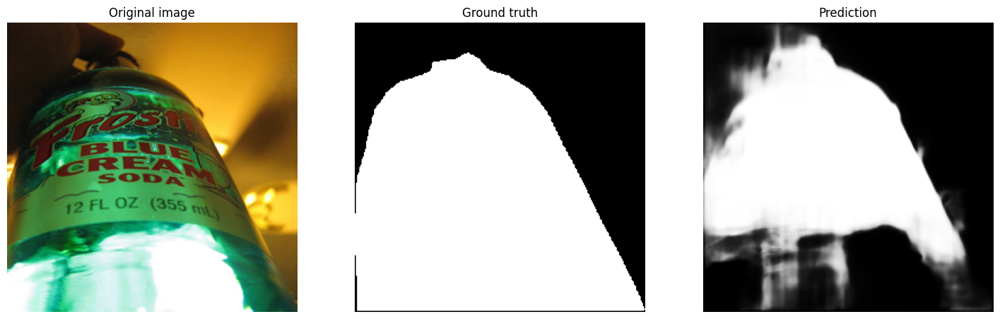

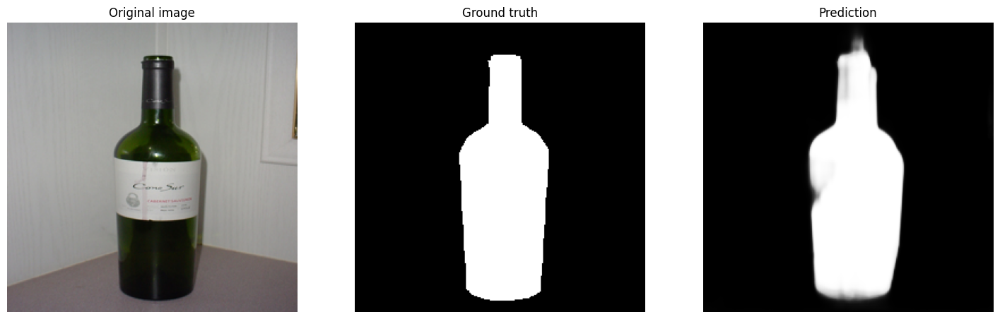

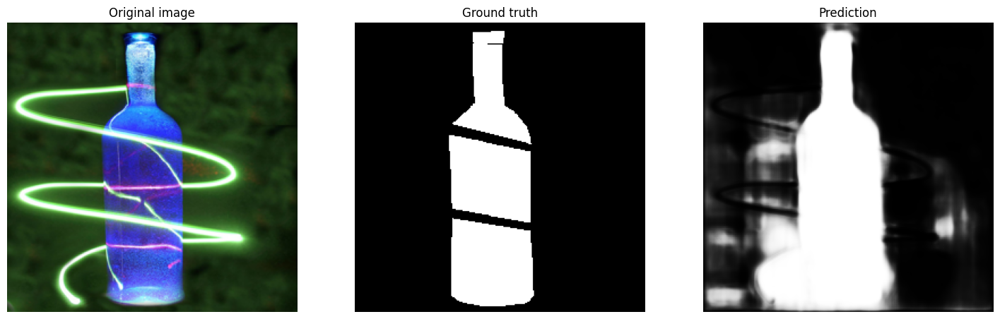

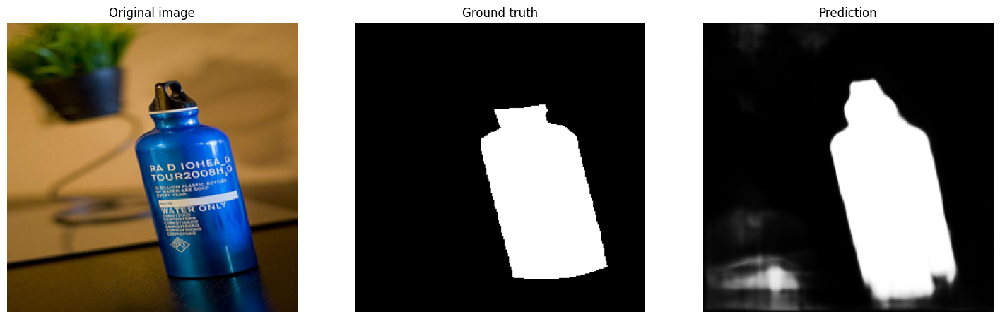

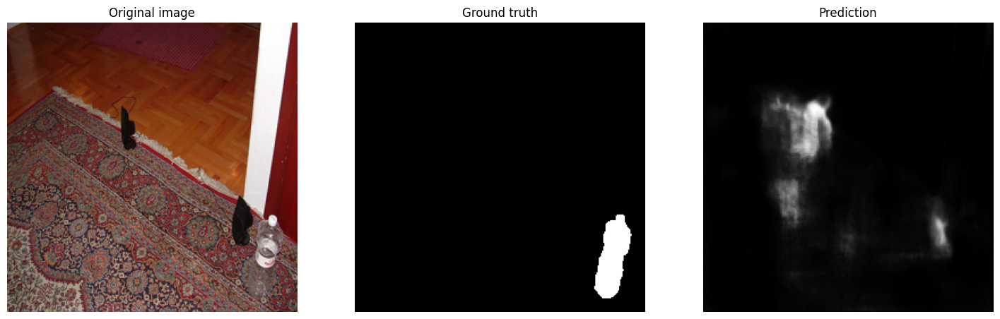

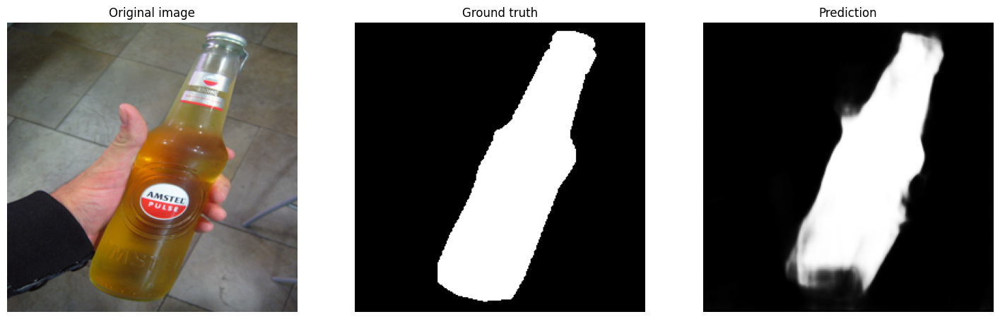

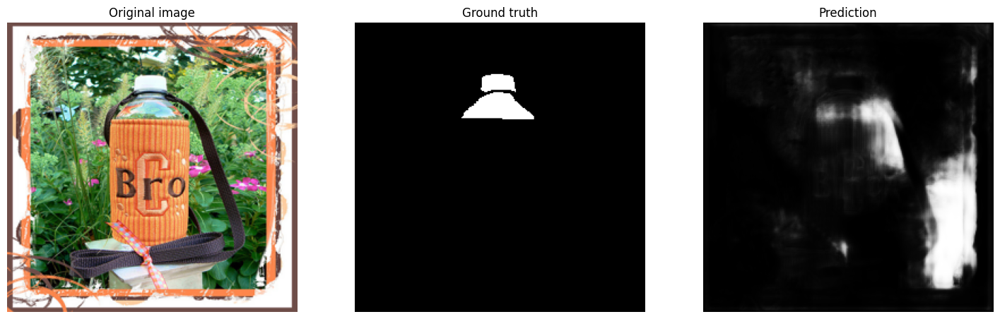

In [62]:
# Function to visualize the predictions alongside the corresponding ground truth and image
def plot_image_and_masks(image, ground_truth, predictions):
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))
    ax[0].imshow(image)
    ax[0].set_title("Original image")
    ax[0].axis('off')
    
    ax[1].imshow(ground_truth, cmap='gray')
    ax[1].set_title("Ground truth")
    ax[1].axis('off')
    
    ax[2].imshow(predictions, cmap='gray')
    ax[2].set_title("Prediction")
    ax[2].axis('off')
    plt.show()

for i in range(10):
    plot_image_and_masks(test_images[i], test_masks[i], predicted_masks[i])

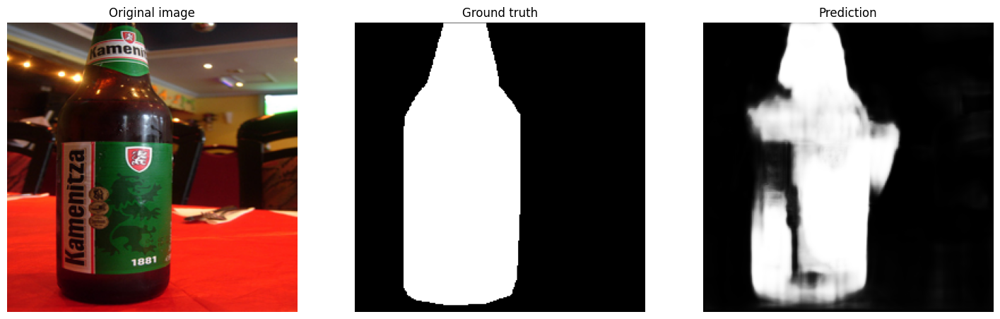

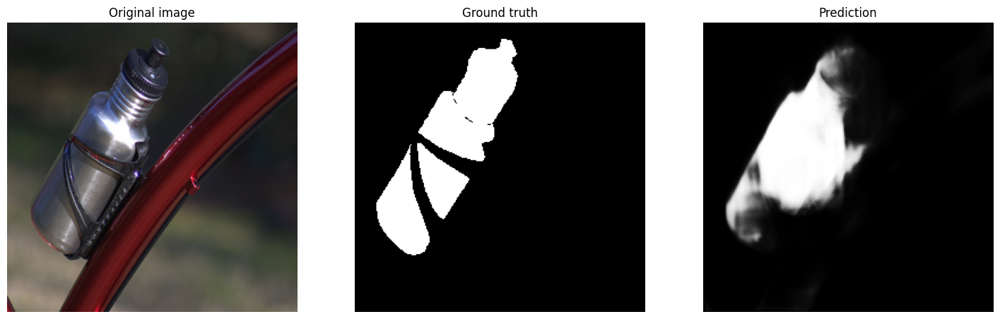

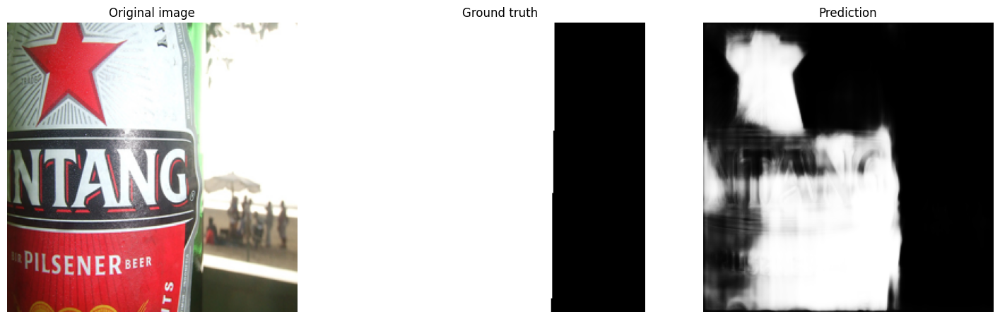

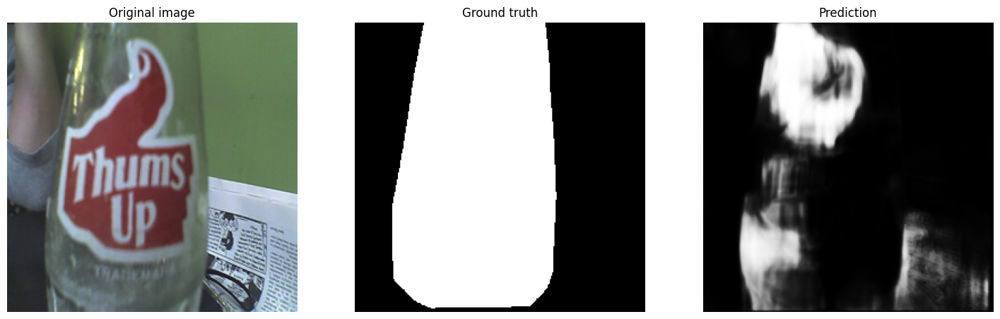

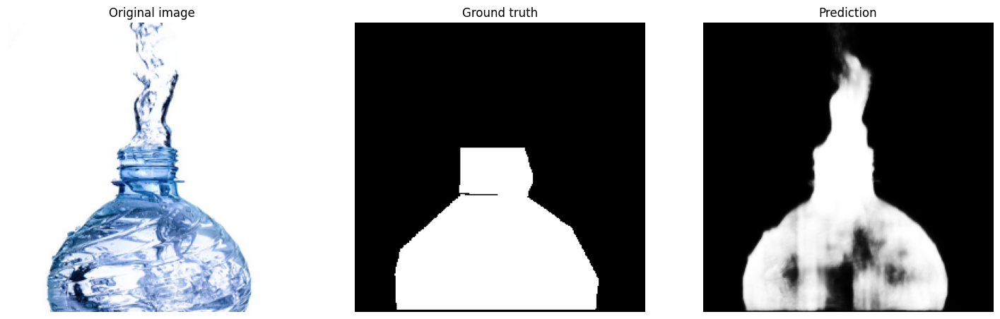

...

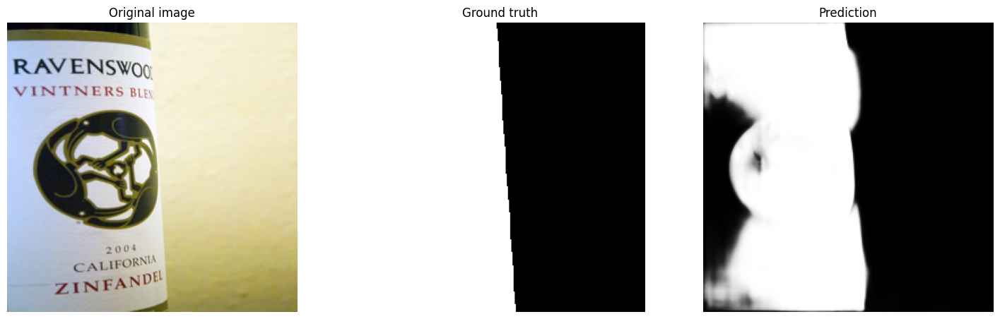

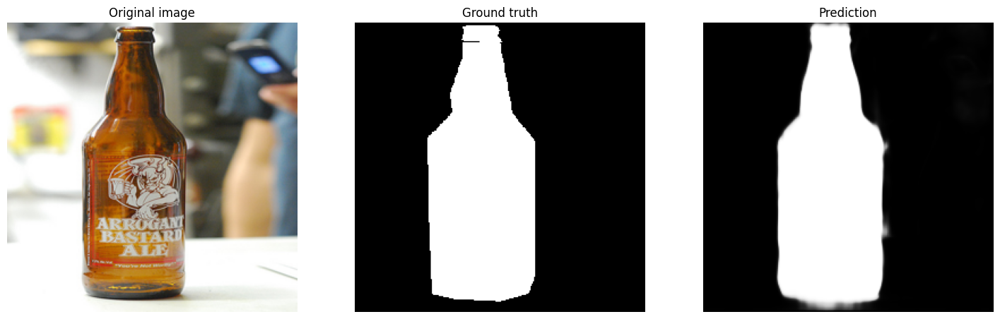

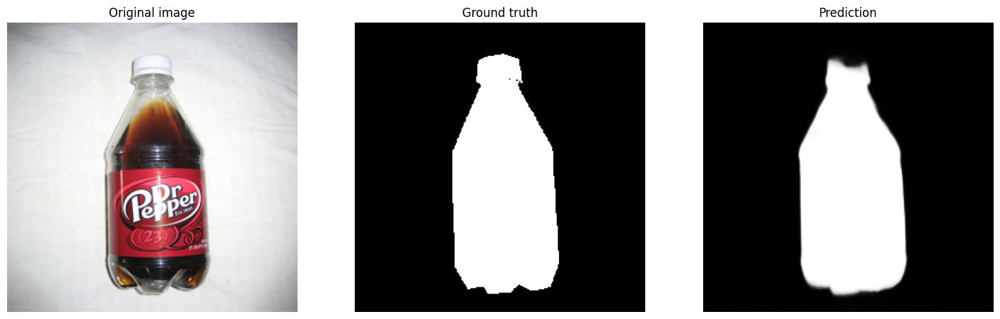

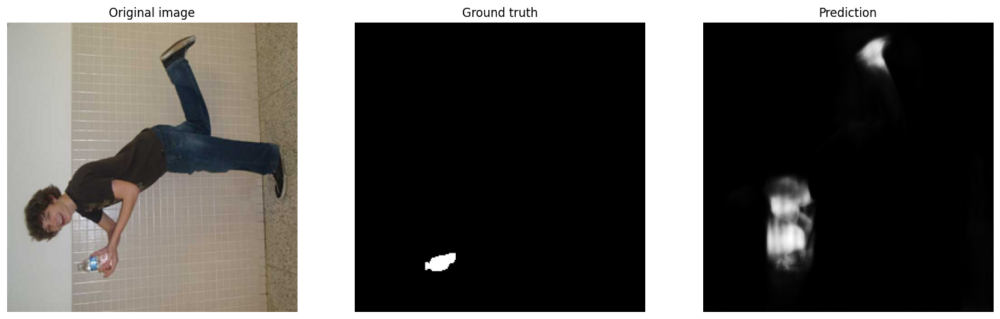

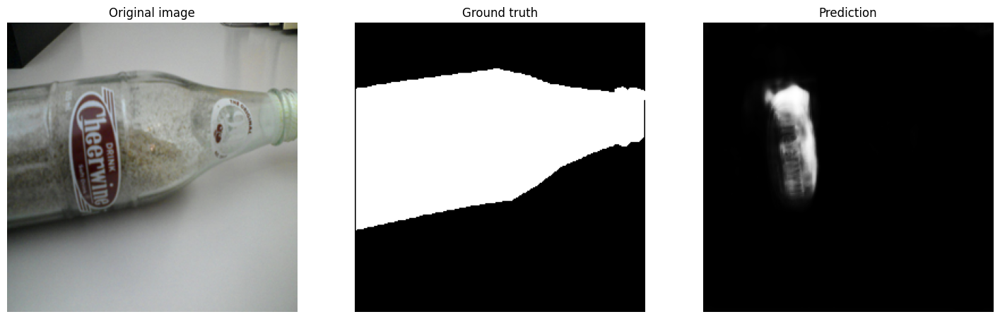

In [63]:
for i in range(10, 21):
    plot_image_and_masks(test_images[i], test_masks[i], predicted_masks[i])

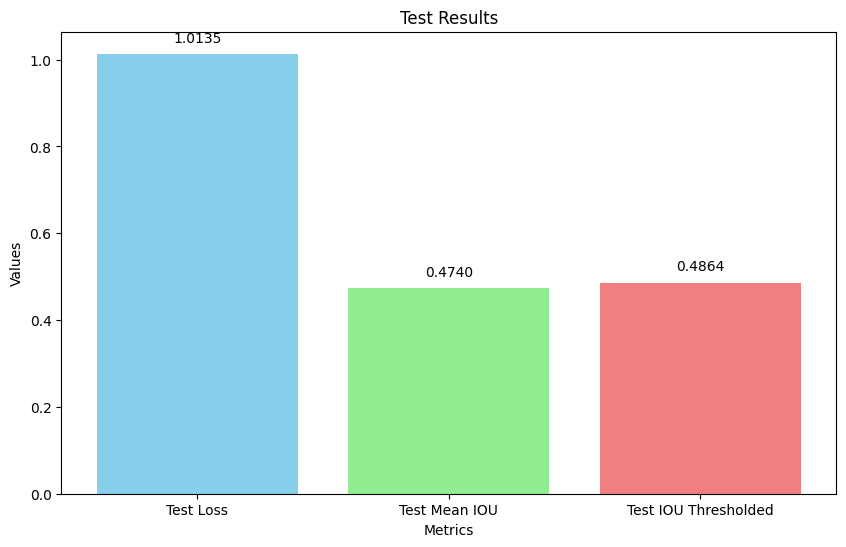

In [67]:
test_metrics = {
    'Test Loss': test_loss,
    'Test Mean IOU': test_iou,
    'Test IOU Thresholded': test_iou_thresholded
}

fig, ax = plt.subplots(figsize=(10, 6))

colors = ['skyblue', 'lightgreen', 'lightcoral']
ax.bar(test_metrics.keys(), test_metrics.values(), color=colors)
ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Test Results')
for i, v in enumerate(test_metrics.values()):
    ax.text(i, v + 0.02, f"{v:.4f}", ha='center', va='bottom')
plt.show()